In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import math

In [2]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
objp = np.zeros((6 * 9, 3), np.float32)
objp[:, :2] = np.mgrid[0:9, 0:6].T.reshape(-1, 2)
obj_points = []
img_points = []
images = glob.glob('chessboard/*.JPG')
for fname in images:
    img = cv2.imread(fname)
    img= cv2.pyrDown(cv2.pyrDown(img))
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    # Find the chess board corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    # If found, add object points, image points (after refining them)
    print(ret)
    if ret == True:
        obj_points.append(objp)
        corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        img_points.append(corners2)

True
True
True
True
True
True
True
True
True
True
True
True


In [3]:
_,mtx, _, _, _ = cv2.calibrateCamera(obj_points, img_points, gray.shape[::-1],None,None)
K=mtx
print(mtx)

[[778.99486366   0.         370.68768646]
 [  0.         782.32093026 480.81826123]
 [  0.           0.           1.        ]]


In [4]:
def cylindricalWarpImage(img1, K):
    fx = K[0,0]
    fy = K[1,1]
    img_height=img1.shape[0]
    img_width=img1.shape[1]
    c = np.zeros_like(img1)
    c_mask = np.zeros_like(img1)
    c_height=c.shape[0]
    c_width=c.shape[1]
    x_center = K[0,2]
    y_center = K[1,2]
    
    for x_c in np.arange(0,c_width):
        for y_c in np.arange(0,c_height):
            theta = (x_c - x_center) / fx
            h     = (y_c - y_center) / fy
            #cylindrical coordinate
            X = np.array([math.sin(theta), h, math.cos(theta)])
            X = np.dot(K,X)
            x_img = X[0] / X[2]
            #stop this circle when minus or outside boundray
            if x_img < 0 or x_img >= img_width:
                continue
                
            y_img = X[1] / X[2]
            if y_img < 0 or y_img >= img_height:
                continue

            c[int(y_c),int(x_c)] = img1[int(y_img),int(x_img)]
            c_mask[int(y_c),int(x_c)] = 255
            
    return (c,c_mask)

In [5]:
def feature_matching(img1,img2):
    
    sift=cv2.xfeatures2d.SIFT_create()
    kp1, des1 = sift.detectAndCompute(img1,None)
    kp2, des2 = sift.detectAndCompute(img2,None)
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks = 50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(des1,des2,k=2)
    good = []
    for m,n in matches:
        if m.distance < 0.7*n.distance:
            good.append(m)
            
    src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
    M, mask = cv2.findHomography(dst_pts,src_pts,cv2.RANSAC,5.0)
    return M, mask

In [6]:
img1=cv2.imread('IMG_5324.JPG')
img1_d= cv2.pyrDown(cv2.pyrDown(img1))
img2=cv2.imread('IMG_5325.JPG')
img2_d= cv2.pyrDown(cv2.pyrDown(img2))
img3=cv2.imread('IMG_5326.JPG')
img3_d= cv2.pyrDown(cv2.pyrDown(img3))
img4=cv2.imread('IMG_5327.JPG')
img4_d= cv2.pyrDown(cv2.pyrDown(img4))
img5=cv2.imread('IMG_5328.JPG')
img5_d= cv2.pyrDown(cv2.pyrDown(img5))
img6=cv2.imread('IMG_5329.JPG')
img6_d= cv2.pyrDown(cv2.pyrDown(img6))
img7=cv2.imread('IMG_5330.JPG')
img7_d= cv2.pyrDown(cv2.pyrDown(img7))
img8=cv2.imread('IMG_5331.JPG')
img8_d= cv2.pyrDown(cv2.pyrDown(img8))
img9=cv2.imread('IMG_5332.JPG')
img9_d= cv2.pyrDown(cv2.pyrDown(img9))
img10=cv2.imread('IMG_5333.JPG')
img10_d= cv2.pyrDown(cv2.pyrDown(img10))
img11=cv2.imread('IMG_5334.JPG')
img11_d= cv2.pyrDown(cv2.pyrDown(img11))
#img12=cv2.imread('IMG_5335.JPG')
#img12_d= cv2.pyrDown(cv2.pyrDown(img12))
# img13=cv2.imread('IMG_5224.JPG')
# img13_d= cv2.pyrDown(cv2.pyrDown(img13))
# img14=cv2.imread('IMG_5223.JPG')
# img14_d= cv2.pyrDown(cv2.pyrDown(img14))
# img15=cv2.imread('IMG_5222.JPG')
# img15_d= cv2.pyrDown(cv2.pyrDown(img15))
# img16=cv2.imread('IMG_5221.JPG')
# img16_d= cv2.pyrDown(cv2.pyrDown(img16))
# img17=cv2.imread('IMG_5220.JPG')
# img17_d= cv2.pyrDown(cv2.pyrDown(img17))
# img18=cv2.imread('IMG_5219.JPG')
# img18_d= cv2.pyrDown(cv2.pyrDown(img18))
# img19=cv2.imread('IMG_5218.JPG')
# img19_d= cv2.pyrDown(cv2.pyrDown(img19))


In [7]:
#cylindricl coordinate
c1,maks1=cylindricalWarpImage(img1_d,K)
c2,mask2=cylindricalWarpImage(img2_d,K)
c3,mask3=cylindricalWarpImage(img3_d,K)
c4,mask4=cylindricalWarpImage(img4_d,K)
c5,mask5=cylindricalWarpImage(img5_d,K)
c6,mask6=cylindricalWarpImage(img6_d,K)
c7,mask7=cylindricalWarpImage(img7_d,K)
c8,mask8=cylindricalWarpImage(img8_d,K)
c9,mask9=cylindricalWarpImage(img9_d,K)
c10,mask10=cylindricalWarpImage(img10_d,K)
c11,mask11=cylindricalWarpImage(img11_d,K)
#c12,mask12=cylindricalWarpImage(img12_d,K)
# c13,mask13=cylindricalWarpImage(img13_d,K)
# c14,mask14=cylindricalWarpImage(img14_d,K)
# c15,mask15=cylindricalWarpImage(img15_d,K)
# c16,mask16=cylindricalWarpImage(img16_d,K)
# c17,mask17=cylindricalWarpImage(img17_d,K)
# c18,mask18=cylindricalWarpImage(img18_d,K)
# c19,mask19=cylindricalWarpImage(img19_d,K)

In [8]:
img1.shape[2]

3

In [9]:
# c1_c=c1[0:c1.shape[0],25:906]
# c2_c=c2[0:c2.shape[0],25:906]
# c3_c=c3[0:c3.shape[0],25:906]
# c4_c=c4[0:c4.shape[0],25:906]
# c5_c=c5[0:c5.shape[0],25:906]
# c6_c=c6[0:c6.shape[0],25:906]
# c7_c=c7[0:c7.shape[0],25:906]
# c8_c=c8[0:c8.shape[0],25:906]
# c9_c=c9[0:c9.shape[0],25:906]

In [10]:
#cut black edge right edge:728 left edge:25
c1_c=c1[0:c1.shape[0],25:729]
c2_c=c2[0:c2.shape[0],25:729]
c3_c=c3[0:c3.shape[0],25:729]
c4_c=c4[0:c4.shape[0],25:729]
c5_c=c5[0:c5.shape[0],25:729]
c6_c=c6[0:c6.shape[0],25:729]
c7_c=c7[0:c7.shape[0],25:729]
c8_c=c8[0:c8.shape[0],25:729]
c9_c=c9[0:c9.shape[0],25:729]
c10_c=c10[0:c10.shape[0],25:729]
c11_c=c11[0:c11.shape[0],25:729]
#c12_c=c12[0:c12.shape[0],25:729]
# c13_c=c13[0:c13.shape[0],25:729]
# c14_c=c14[0:c14.shape[0],25:729]
# c15_c=c15[0:c15.shape[0],25:729]
# c16_c=c16[0:c16.shape[0],25:729]
# c17_c=c17[0:c17.shape[0],25:729]
# c18_c=c18[0:c18.shape[0],25:729]
# c19_c=c19[0:c19.shape[0],25:729]

In [11]:
def horizontal_stitch(out1,out2):
    for i in range(out2.shape[0]):
        for j in range (out2.shape[1]):
            if out2[i][j].all()==0:
                out[i][j]=out[i][j]
            elif out2[i][j].all()!=0:
                out[i][j]=out2[i][j]
    return out

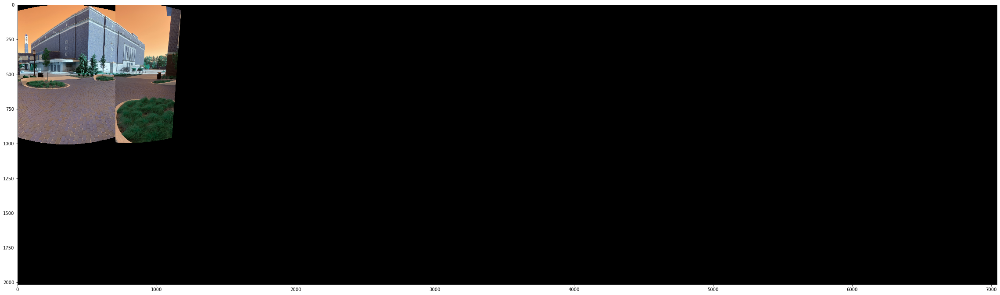

In [12]:
#stitch img1 and img2
M1,mask1=feature_matching(c1_c,c2_c)
out = cv2.warpPerspective(c2_c, M1, (c2_c.shape[1]*10,c2_c.shape[0]*2))
out[0:c1_c.shape[0],0:c1_c.shape[1]] = c1_c
plt.figure(figsize=(40,20))
plt.imshow(out)

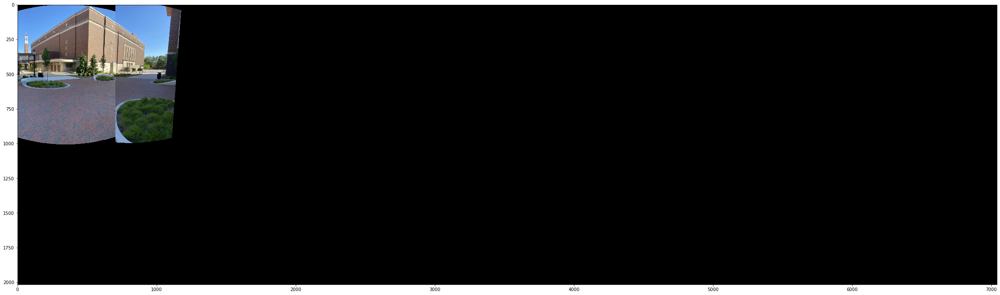

In [13]:
plt.figure(figsize=(40,20))
out_look=cv2.cvtColor(out,cv2.COLOR_BGR2RGB)
plt.imshow(out_look)

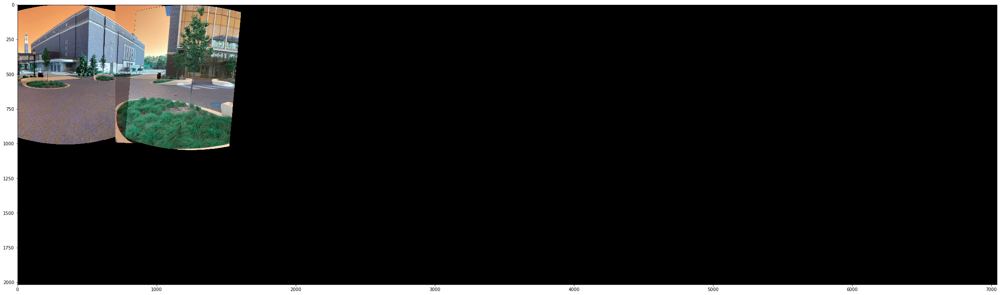

In [14]:
#stitch img 1,2,3
M2,mask2=feature_matching(out,c3_c)
out2 = cv2.warpPerspective(c3_c, M2, (c3_c.shape[1]*10,c3_c.shape[0]*2))
out=horizontal_stitch(out,out2)
plt.figure(figsize=(40,20))
plt.imshow(out)

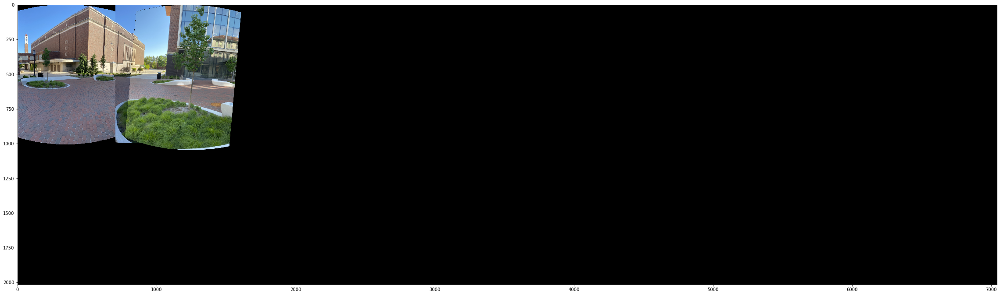

In [15]:
plt.figure(figsize=(40,20))
out_look=cv2.cvtColor(out,cv2.COLOR_BGR2RGB)
plt.imshow(out_look)

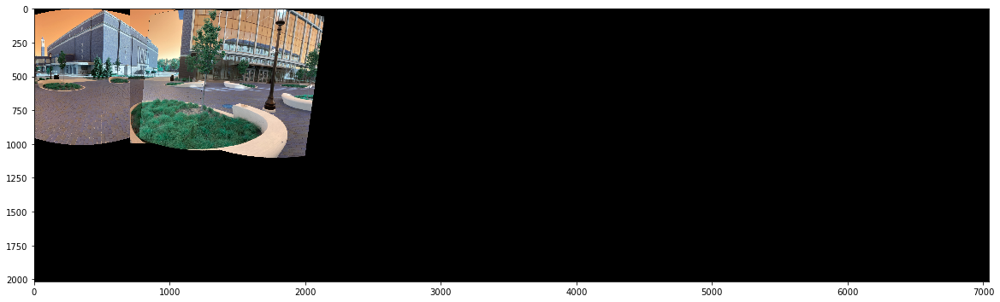

In [16]:
#stitch img1,2,3,4
M3,mask3=feature_matching(out,c4_c)
out3 = cv2.warpPerspective(c4_c, M3, (c4_c.shape[1]*10,c4_c.shape[0]*2))
out=horizontal_stitch(out,out3)
plt.figure(figsize=(20,10))
plt.imshow(out)

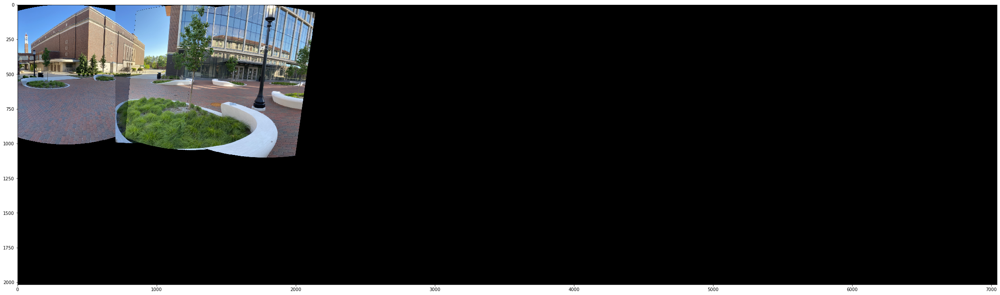

In [17]:
plt.figure(figsize=(40,20))
out_look=cv2.cvtColor(out,cv2.COLOR_BGR2RGB)
plt.imshow(out_look)

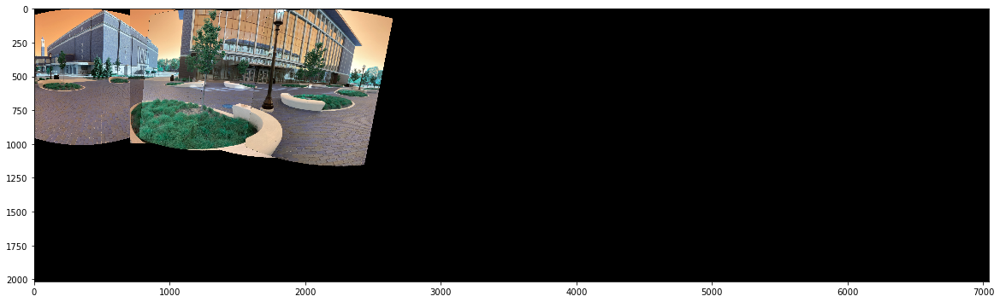

In [18]:
#stitch img1,2,3,4,5
M4,mask4=feature_matching(out,c5_c)
out4 = cv2.warpPerspective(c5_c, M4, (c5_c.shape[1]*10,c5_c.shape[0]*2))
out=horizontal_stitch(out,out4)
plt.figure(figsize=(20,10))
plt.imshow(out)

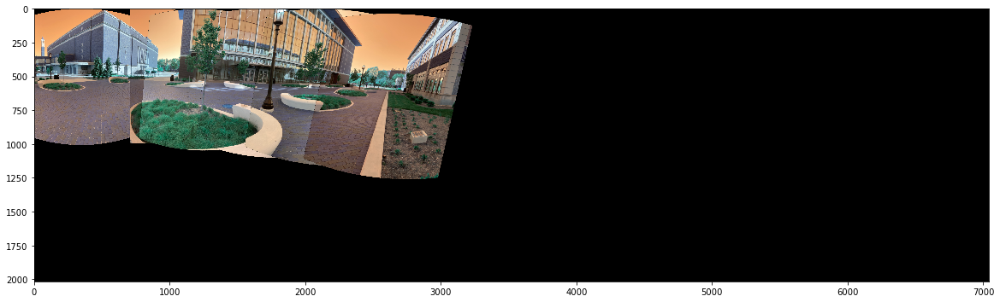

In [19]:
#stitch img1,2,3,4,5,6
M5,mask5=feature_matching(out,c6_c)
out5 = cv2.warpPerspective(c6_c, M5, (c6_c.shape[1]*10,c6_c.shape[0]*2))
out=horizontal_stitch(out,out5)
plt.figure(figsize=(20,10))
plt.imshow(out)

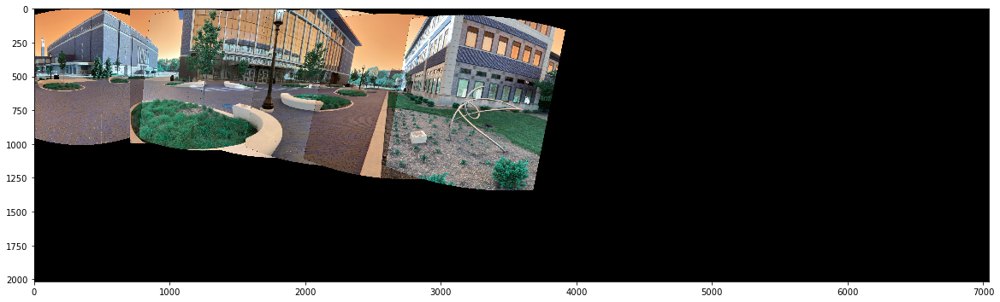

In [20]:
#stitch img1,2,3,4,5,6,7
M6,mask6=feature_matching(out,c7_c)
out6 = cv2.warpPerspective(c7_c, M6, (c7_c.shape[1]*10,c7_c.shape[0]*2))
out=horizontal_stitch(out,out6)
plt.figure(figsize=(20,10))
plt.imshow(out)

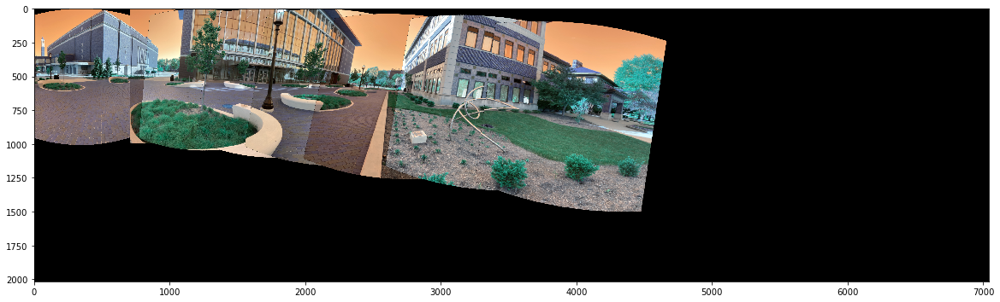

In [21]:
#stitch img1,2,3,4,5,6,7,8
M7,mask7=feature_matching(out,c8_c)
out7 = cv2.warpPerspective(c8_c, M7, (c8_c.shape[1]*10,c8_c.shape[0]*2))
out=horizontal_stitch(out,out7)
plt.figure(figsize=(20,10))
plt.imshow(out)

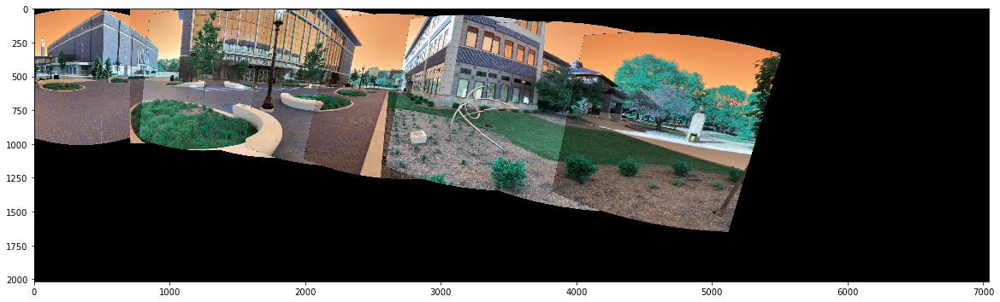

In [22]:
#stitch img1,2,3,4,5,6,7,8,9
M8,mask8=feature_matching(out,c9_c)
out8 = cv2.warpPerspective(c9_c, M8, (c9_c.shape[1]*10,c9_c.shape[0]*2))
out=horizontal_stitch(out,out8)
plt.figure(figsize=(20,10))
plt.imshow(out)

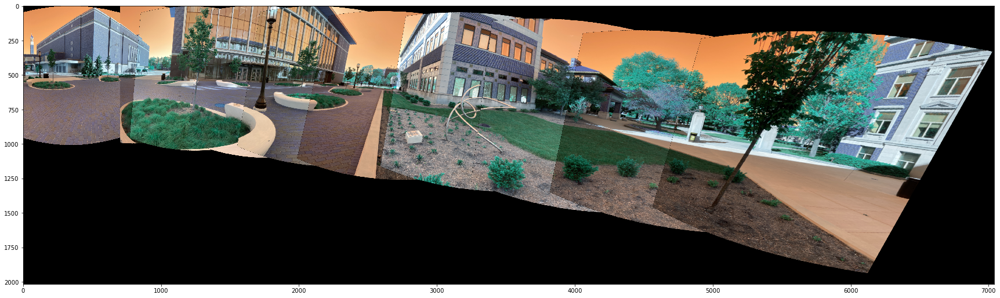

In [23]:
#stitch img1,2,3,4,5,6,7,8,9,10
M9,mask9=feature_matching(out,c10_c)
out9 = cv2.warpPerspective(c10_c, M9, (c10_c.shape[1]*10,c10_c.shape[0]*2))
out=horizontal_stitch(out,out9)
plt.figure(figsize=(30,30))
plt.imshow(out)


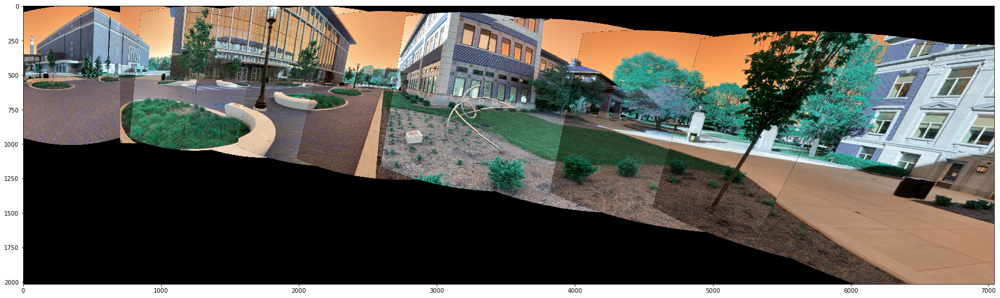

In [24]:
#stitch img1,2,3,4,5,6,7,8,9,10,11
M10,mask9=feature_matching(out,c11_c)
out10 = cv2.warpPerspective(c11_c, M10, (c11_c.shape[1]*10,c11_c.shape[0]*2))
out=horizontal_stitch(out,out10)
plt.figure(figsize=(30,30))
plt.imshow(out)

In [25]:
# #stitch img1,2,3,4,5,6,7,8,9,10,11,12
# M11,mask11=feature_matching(out,c12_c)
# out11 = cv2.warpPerspective(c12_c, M11, (c12_c.shape[1]*10,c12_c.shape[0]*2))
# out=horizontal_stitch(out,out11)
# plt.figure(figsize=(30,30))
# plt.imshow(out)

In [26]:
look=cv2.cvtColor(out,cv2.COLOR_BGR2RGB)

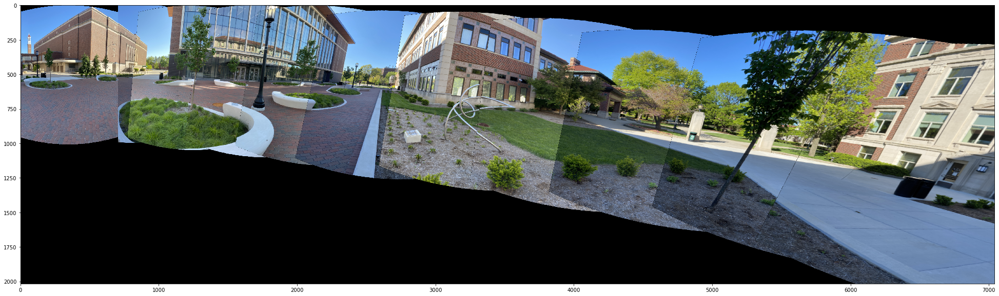

In [27]:
plt.figure(figsize=(50,10))
plt.imshow(look)

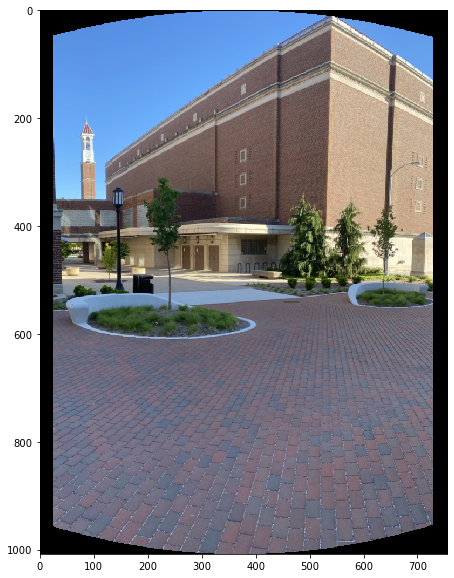

In [28]:
plt.figure(figsize=(20,10))
c1_look=cv2.cvtColor(c1,cv2.COLOR_BGR2RGB)
plt.imshow(c1_look)